# Lección 5: Pipeline de Aprendizaje Automático

Autor: Jorge Castro, Fabricio Quirós Corella

---

Este notebook pretende abarcar el siguiente contenido (120 min):

- Recolección de datos (5 min)
- Extracción de características (15 min)
- Análisis exploratorio de los datos (25 min)
- Ingeniería de características (20 min)
- Selección de características (20 min)
- Modelado de aprendizaje automático (25 min)
- Conclusiones sobre el aprendizaje automático (10 min)

En el campo de aprendizaje automático, existe una enorme variedad respecto a:

- **características y naturaleza de los datos:** estructurados y no estructurados, con o sin valores faltantes, con o sin desbalance de clases, etc.
- **tareas a realizar:** regresión, clasificación, clustering, reducción de dimensionalidad, etc.
- **modelos:** árboles de decisión, máquinas de soporte vectorial, redes neuronales, etc.
- **enfoques de aprendizaje**: para resolver estas tareas (supervisado, no supervisado, semi-supervisado, por reforzamiento, etc).
- **métricas para evaluar o comparar el desempeño:** $R^2$, RMSE, MAE, exactitud, recuperación, puntaje $F_1$, etc.

Por lo tanto, es realmente difícil pensar en un único flujo de trabajo o metodología de diseño que aplique para cualquier proyecto dentro del área de aprendizaje automático. No obstante, existe una secuencia de acciones que modifican el set de datos en crudo de diferentes fuentes a un formato que pueda ser almancenado y utilizado para el posterior análisis, normalmente en aplicaciones de aprendizaje automático, enfocadas en **datos estructurados** y **aprendizaje supervisado**.

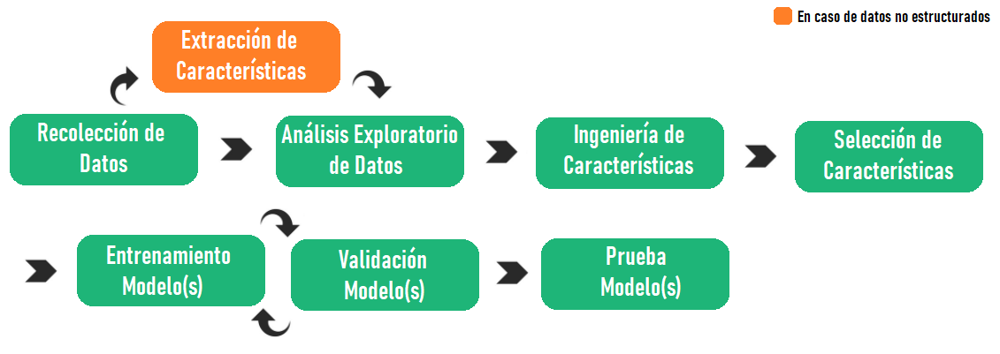

## Recolección de datos

- Identificación del problema a resolver.
- Elaboración del plan de obtención de datos.
- Determinar fuentes y formatos de la información recolectada.
- Análisis de susceptibilidad al error humano del proceso de obtención de datos.
- Arrojar el conjunto de datos recolectado a un algoritmo de aprendizaje automático y esperar los mejores resultados, no es la mejor estrategia.

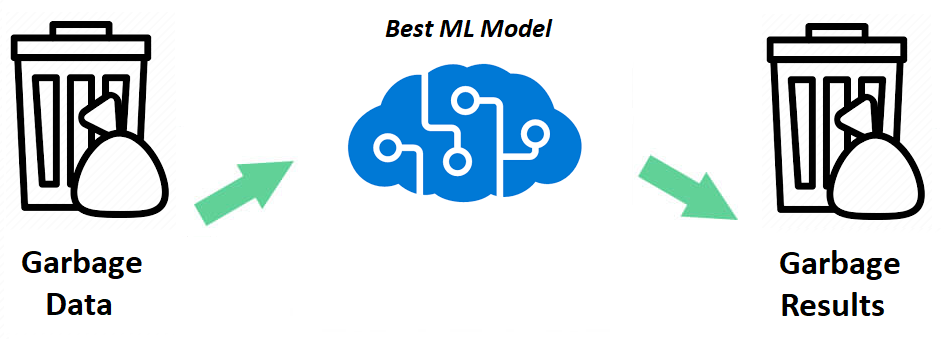

## Extracción de características

La extracción de características es un paso adicional que suele tomarse cuando trabajamos con **datos no estructurados**, como imágenes, audio o video. Este consiste en extraer las características más relevantes de los datos que permitan un mejor desempeño del modelo de aprendizaje automático. En el caso de las imágenes, es usual aplicar filtros para eliminar el ruido, hacer una segmentación para facilitar la detección de objetos de interés y posteriormente calcular métricas sobre la forma, tamaño, color o textura de los mismos.

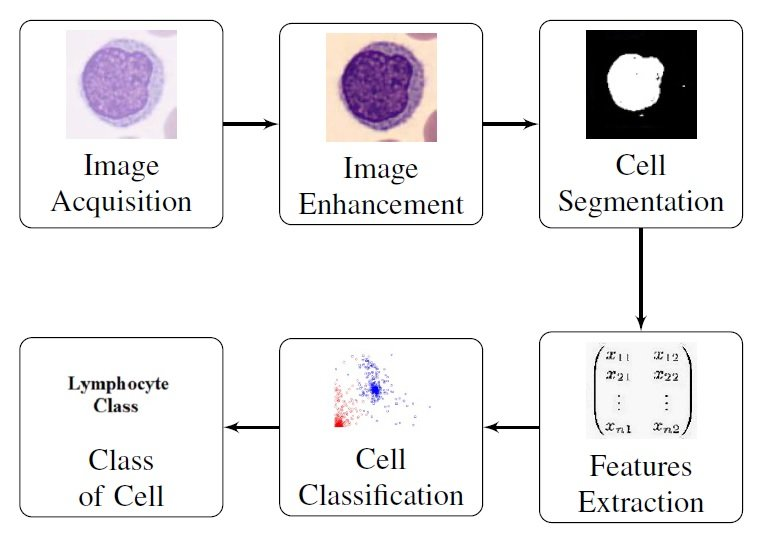

## Análisis exploratorio de los datos

El análisis exploratorio de los datos (EDA) permite resumir y entender las características principales de los datos a partir de estadísticas descriptivas y técnicas visuales. Facilita la identificación de variables y tipos de datos, así como el análisis de métricas básicas. El EDA permite encontrar patrones, relaciones o anomalías mediante análisis univariado o multivariado de forma gráfica o no, para tomar mejores desiciones mejor informadas a lo largo del flujo de trabajo.

Generalmente, se llevan a cabo una o varias de las siguientes actividades:

- Despliegue de mapas de características.
- Visualización de un resumen estadístico del conjunto de datos.
- Exploración visual de cualquier relación que pueda tener cada atributo con la clase a estimar.
- Observación de cualquier tipo de agrupamiento que pueda presentar los datos.

A continuación, veremos algunas de estas actividades del EDA aplicadas a un dataset en Python.

#### Descripción del set de datos

**Nombre**: Pima Indians Diabetes Database (tomado de https://www.kaggle.com/uciml/pima-indians-diabetes-database)

**Problema a resolver**: Predicción sobre aparición de diabetes en pacientes a partir de medidas de diagnóstico

**Resumen**: Este conjunto de datos es originalmente del Instituto Nacional de Diabetes y Enfermedades Digestivas y Renales. El objetivo del conjunto de datos es predecir de forma diagnóstica si un paciente tiene diabetes o no, basándose en determinadas medidas de diagnóstico incluidas en el conjunto de datos. Se impusieron varias restricciones a la selección de estas instancias de una base de datos más grande. En particular, todos los pacientes aquí son mujeres de al menos 21 años de edad y de origen indio Pima.

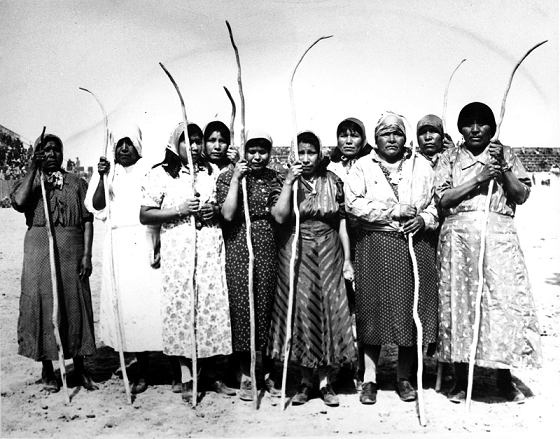

**Información de las columnas**:

0. *Number of times pregnant*

1. *Plasma glucose concentration a 2 hours in an oral glucose tolerance test*

2. *Diastolic blood pressure* (mm Hg)

3. *Triceps skin fold thickness* (mm)

4. *2-Hour serum insulin* (mu U/ml)

5. *Body mass index* (weight in kg/(height in m)^2)

6. *Diabetes pedigree function*

7. *Age* (years)

8. *Class variable* (0 or 1)

Bajo el presente contexto, las variables independientes son llamadas **entradas**, **características** (*features*) o **predictores**. Asimismo, las variables dependientes son llamadas **salidas**, **clases** (*tags*) o **variables de respuesta** (*responses*).

Habilitemos la carpeta de Google Drive en nuestro ambiente de trabajo.

In [ ]:
#Código para montar el Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Opcionalmente, podemos subir el archivo del conjunto de datos directamente a la sesión de Colab.

In [ ]:
#Subir el set de datos a Google Colab
from google.colab import files
uploaded = files.upload()

---

Importemos las librerías necesarias.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

Cargamos el archivo separado por comas que contiene el set de datos.

In [2]:
#filepath = '/content/drive/MyDrive/MachineLearning/datasets/diabetes.csv'
filepath = '/home/fquiros/Talleres/Python/MachineLearning/datasets/diabetes.csv'
dataset = pd.read_csv(filepath)
dataset.shape

(769, 9)

Verifiquemos el tipo de dato correspondiente al set de datos.

In [3]:
type(dataset) #tipo de dato correspondiente al dataset

pandas.core.frame.DataFrame

El tipo `DataFrame` de la librería `Pandas` para la manipulación de datos contiene métodos integrados, para el despliegue de información premilinar del conjunto de datos.

In [4]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 769 entries, 0 to 768
Data columns (total 9 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   Pima Indians Diabetes Database  769 non-null    object
 1   Unnamed: 1                      769 non-null    object
 2   Unnamed: 2                      769 non-null    object
 3   Unnamed: 3                      769 non-null    object
 4   Unnamed: 4                      769 non-null    object
 5   Unnamed: 5                      769 non-null    object
 6   Unnamed: 6                      769 non-null    object
 7   Unnamed: 7                      769 non-null    object
 8   Unnamed: 8                      769 non-null    object
dtypes: object(9)
memory usage: 54.2+ KB


Realicemos una inspección rápida del archivo correspondiente al set de datos.

In [5]:
!head /home/fquiros/Talleres/Python/MachineLearning/datasets/diabetes.csv

Pima Indians Diabetes Database,,,,,,,,
Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
6,148,72,35,0,33.6,0.627,50,1
1,85,66,29,0,26.6,0.351,31,0
8,183,64,0,0,23.3,0.672,32,1
1,89,66,23,94,28.1,0.167,21,0
0,137,40,35,168,43.1,2.288,33,1
5,116,74,0,0,25.6,0.201,30,0
3,78,50,32,88,31,0.248,26,1
10,115,0,0,0,35.3,0.134,29,0


Los índices de los dataframes en `Pandas` inician en cero, por lo que indicamos que el encabezado del set de datos se encuentra en la línea uno del archivo separado por comas.

In [6]:
#Algunos parámetros importantes de pd.read_csv----------------------------------
#header: indica en qué línea comienza el encabezado (nombres de las columnas)
#skiprows: indica hasta que línea inicial se debe ignorar el contenido del csv.
#sep: caracter usado para separar los valores de cada columna por defecto es ','
#na_values: especificar el caracter a interpretar como valores faltantes
#nrows: cuantas filas se desean leer del csv
#Documentación oficial: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.read_csv.html
#-------------------------------------------------------------------------------
dataset = pd.read_csv(filepath, header=1) #primera fila es el encabezado!
dataset.shape  #dimensiones del set de datos

(768, 9)

Comprobemos que el dataset fue almacenado correctamente en la variable global.

In [7]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


#### Identificación de variables y tipos de datos

- **Variables numéricas:** discretas (números enteros) y continuas (cualquier valor en un rango definido).
- **Variables categóricas:** ordinales (categorías que pueden ser ordenadas significativamente) y nominales (no hay un orden intrínseco de las etiquetas).

Revisemos las primeras (*head*) y las últimas (*tail*) observaciones o muestras del dataset.

In [8]:
dataset.head(n=25) #Primeras 25 filas

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
5,5,116,74,0,0,25.6,0.201,30,0
6,3,78,50,32,88,31.0,0.248,26,1
7,10,115,0,0,0,35.3,0.134,29,0
8,2,197,70,45,543,30.5,0.158,53,1
9,8,125,96,0,0,0.0,0.232,54,1


In [9]:
dataset.tail(n=25) #Ultimas 25 filas

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
743,9,140,94,0,0,32.7,0.734,45,1
744,13,153,88,37,140,40.6,1.174,39,0
745,12,100,84,33,105,30.0,0.488,46,0
746,1,147,94,41,0,49.3,0.358,27,1
747,1,81,74,41,57,46.3,1.096,32,0
748,3,187,70,22,200,36.4,0.408,36,1
749,6,162,62,0,0,24.3,0.178,50,1
750,4,136,70,0,0,31.2,1.182,22,1
751,1,121,78,39,74,39.0,0.261,28,0
752,3,108,62,24,0,26.0,0.223,25,0


Es posible obtener estadística descriptiva de cada atributo del set de datos.

In [10]:
#Imprimir en pantalla estadísticas descriptivas de cada columna
dataset.iloc[:,:-1].describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000


Ahora, revisamos si la cantidad de muestras de la clase negativa (`0: no diabetes`) está balanceada con respecto a la de la clase positiva (`1: diabetes`).

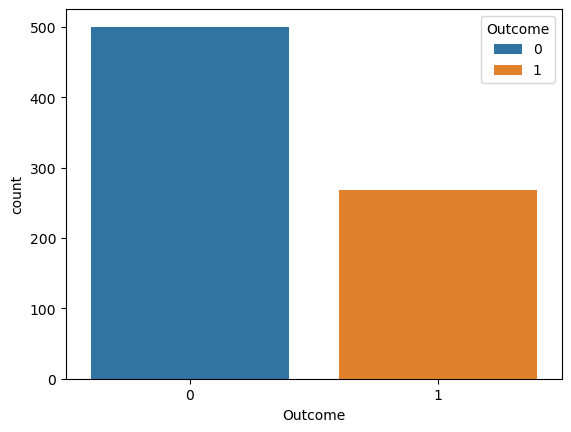

Outcome
0    500
1    268
Name: count, dtype: int64

In [11]:
#Observar si las clases están o no desbalanceadas
import seaborn as sns # librerías para EDA visual
sns.countplot(x=dataset.Outcome, hue=dataset.Outcome, orient='h')
plt.show()
dataset['Outcome'].value_counts()

Se observa que en el set de datos hay casi el doble de personas no diabéticas (500) respecto a las diabéticas (268), por lo cual se puede decir que hay un **desbalance considerable de clases**.

#### Análisis bivariado

Es una de las técnicas más simples de estadística cuantitativa y consiste en el análisis visual de un par de variables o características mediante un diagrama de dispersión, con el propósito de determinar la relación empírica entre ellas.

<Axes: xlabel='Glucose', ylabel='BloodPressure'>

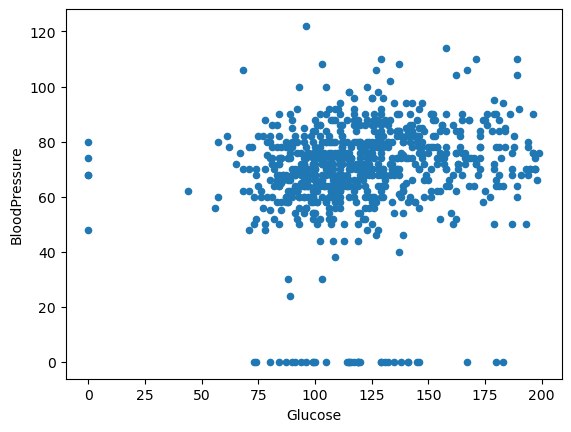

In [12]:
# Glucosa vs Presión Sanguínea
dataset.plot.scatter('Glucose', 'BloodPressure')

El análisis bivariado es un caso especial simple del **análisis multivariado**, donde múltiples relaciones entre múltiples variables son examinadas simultáneamente. Por ejemplo,

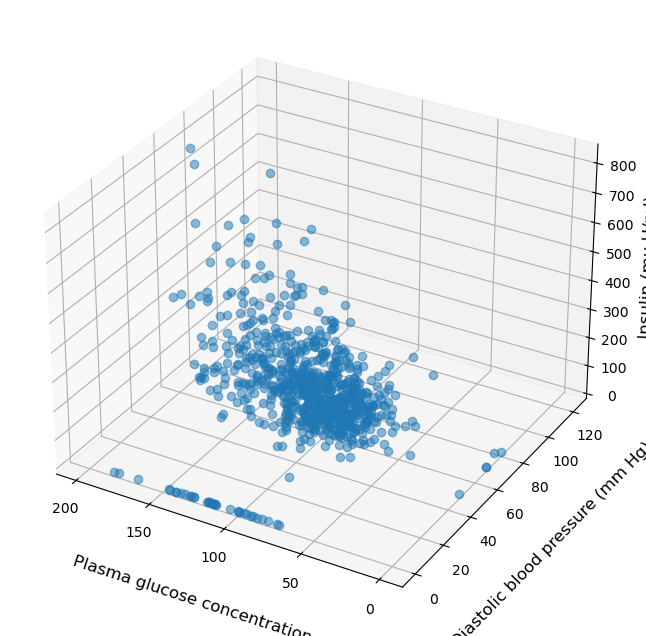

In [13]:
#Grafico en 3D
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

#Variables a analizar
x = dataset['Glucose'].values
y = dataset['BloodPressure'].values
z = dataset['Insulin'].values

#Despliegue del gráfico
ax.plot(x, y, z, zorder=15, linestyle='none', marker='o', alpha=0.5)
ax.set_xlabel('Plasma glucose concentration', fontsize=12, labelpad=15)
ax.set_ylabel('Diastolic blood pressure (mm Hg)', fontsize=12, labelpad=15)
ax.set_zlabel('Insulin (mu U/ml)', fontsize=12)
ax.locator_params(nbins=4, axis='x')
ax.locator_params(nbins=5, axis='x')
ax.invert_xaxis()
ax.view_init(elev=30)

#### Análisis de correlación

- *Pairplots*: facilitan observar la relación entre cada par de predictores y la distribución individual de cada variable.
- Permite una inspección visual si dos variables **tienen o no correlación** y si esta es **positiva** o **negativa**.
- Determinar la presencia de **inclinación** en las distribuciones y de **valores extremos** (*outliers*).
- Evidenciar las variables individuales (histrogramas) o pares de variables (diagramas de dispersión) que logran **mejor separación de clases**.

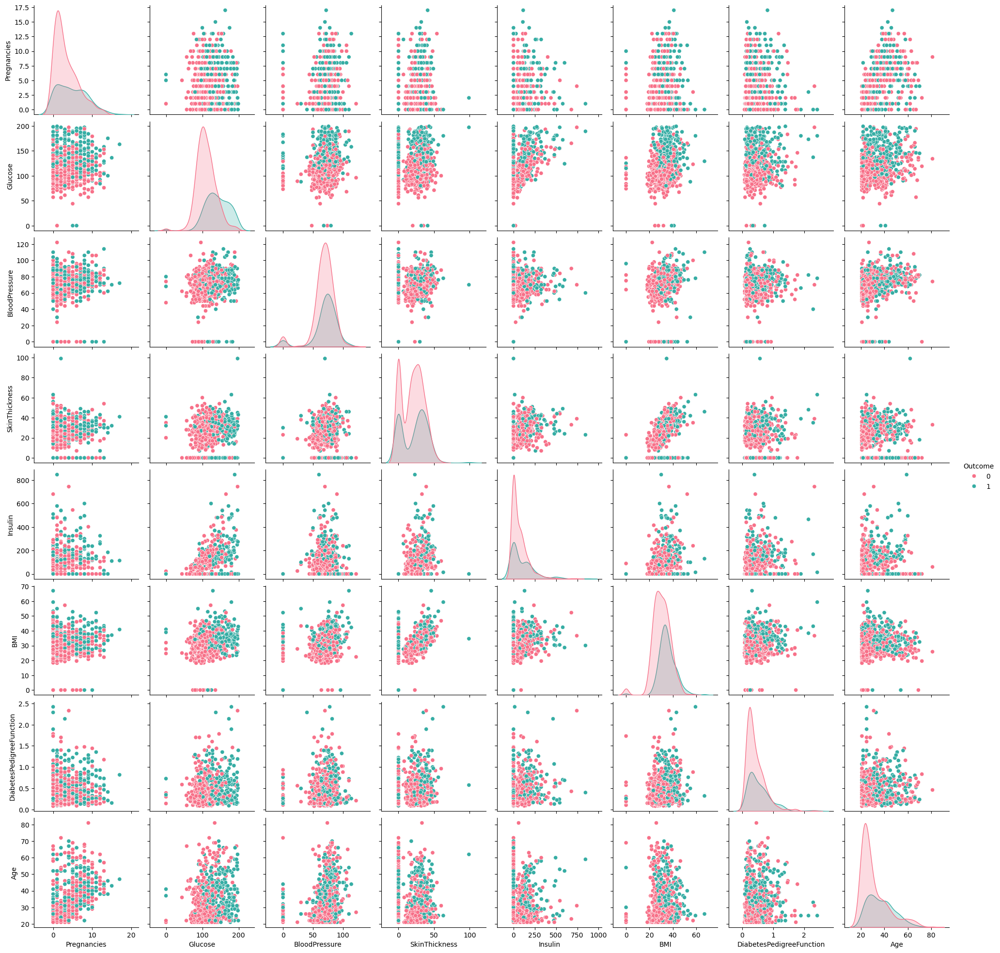

In [14]:
#imprimir en pantalla un pairplot
pp = sns.pairplot(dataset, hue='Outcome', palette='husl')

Al observar los gráficos de dispersión podemos decir que no hay una pareja de predictores capaces de claramente separar las dos clases en la distribución de datos, por lo que se habla de una **redundancia de características significativa**.

#### Análisis de valores atípicos

En estadísitica, un valor atípico (*outlier*) es aquel punto de observación que se encuentra distante del resto de observaciones. Requiere un análisis previo basado en la naturaleza de los datos con el objetivo de determinar si es necesario mantener o eliminar los outliers, mediante el uso de gráficos de caja o *boxplots*.


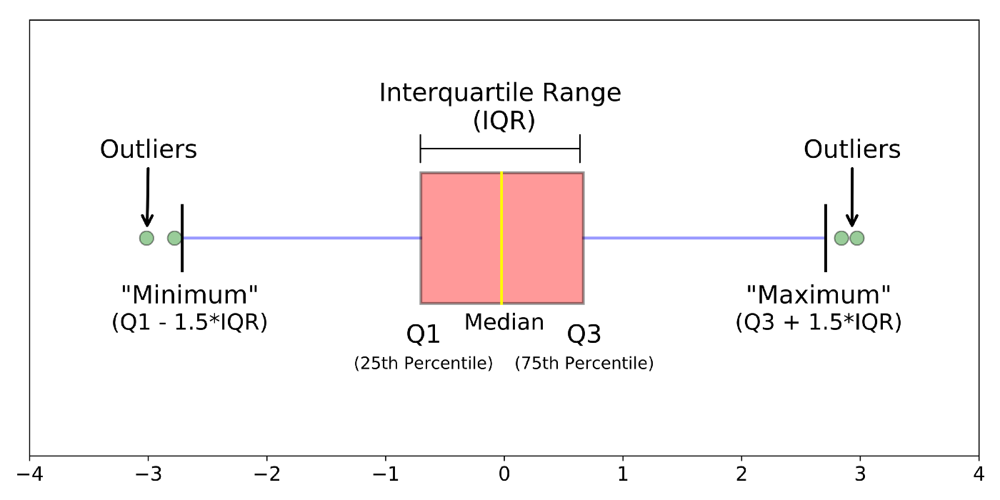


Un *boxplot* corresponde a un método de visualización para representar grupos de datos númericos a través de sus cuartiles. De igual manera, estos gráficos cuentan con líneas que se extienden verticalmente, con la finalidad de indicar la variabilidad afuera de los cuartiles superiores e inferiores.

Los boxplots utilizan el método del rango intercuartil (IQR) para desplegar los datos y los valores atípicos. En un boxplot, generalmente se aplica análisis gráfico univariado y los outliers se grafican como puntos separados.

<Axes: xlabel='Insulin'>

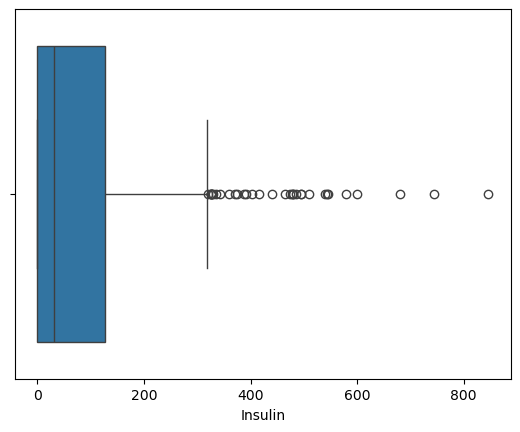

In [15]:
# imprimir en pantalla un boxplot
sns.boxplot(x='Insulin', data=dataset)

Similar a la desviación estándar o la varianza, el IQR es una medida estadística de dispersión, pero mucho más robusta, la cual es equivalente a la diferencia entre los percentiles 75 y 25 (entre los cuartiles superior e inferior):

$IQR = Q_3 − Q_1$

In [16]:
Q1 = dataset.iloc[:,:-1].quantile(0.25)
Q3 = dataset.iloc[:,:-1].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

Pregnancies                   5.0000
Glucose                      41.2500
BloodPressure                18.0000
SkinThickness                32.0000
Insulin                     127.2500
BMI                           9.3000
DiabetesPedigreeFunction      0.3825
Age                          17.0000
dtype: float64


Una vez obtenidos los puntajes del rango intercuartil para cada una de las observaciones, determinamos los valores válidos y los atípicos.

In [17]:
minimum = Q1 - 1.5 * IQR # limite inferior
maximum = Q3 + 1.5 * IQR # limiter superior
outliers = (dataset.iloc[:,:-1] < minimum) | (dataset.iloc[:,:-1] > maximum) # condicion de valores atipicos
print(outliers.sum()) # inspección de outliers por descriptor, sin variable de respuesta
print('Cantidad de outliers: {}'.format(outliers.values.sum())) # inspección total de outliers

Pregnancies                  4
Glucose                      5
BloodPressure               45
SkinThickness                1
Insulin                     34
BMI                         19
DiabetesPedigreeFunction    29
Age                          9
dtype: int64
Cantidad de outliers: 146


#### Análisis de valores inválidos o faltantes

Si volvemos a ejecutar la función `.info()` podemos ver que no se detectan valores nulos en ninguna columna del set de datos.

In [18]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


Sin embargo, si prestamos mayor atención al significado de la columna 1 hasta la columna 5 del arreglo de datos.

In [19]:
dataset.head(n=25) #primeras 25 observaciones

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
5,5,116,74,0,0,25.6,0.201,30,0
6,3,78,50,32,88,31.0,0.248,26,1
7,10,115,0,0,0,35.3,0.134,29,0
8,2,197,70,45,543,30.5,0.158,53,1
9,8,125,96,0,0,0.0,0.232,54,1


Nos damos cuenta que los valores faltantes son representados como ceros; por ejemplo, no tiene sentido que una persona tenga cero insulina o una presión arterial de cero.

Si reemplazamos los ceros en las columnas de la 1 a la 5 por *NANs* (tipo de dato usado en `numpy` para representar los valores faltantes), podemos posteriormente contarlos y saber cuantos valores faltantes hay en cada columna.

In [20]:
# Copia temporal del set de datos
tempDataset = dataset.copy().astype(np.float64)
#Reemplazo de ceros por NaNs en las columnas de la 1 a la 5
tempDataset.iloc[:,1:-1] = tempDataset.iloc[:,1:-1].replace(0, np.NaN)
#Conteo de NaNs en las columnas de la 1 a la 5
print(tempDataset.isnull().sum())
print('Números de valores faltantes: {}'.format(tempDataset.isnull().values.sum()))

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64
Números de valores faltantes: 652


Naturalmente, la estrategia más simple consiste en eliminar todas las instancias que contengan valores faltantes. En este caso, como la proporción de valores inválidos es muy elevada, no resulta una buena idea y conviene más hacer un reemplazo de estos valores faltantes.

## Ingeniería de características

Posterior a identificar las partes incorrectas, irrelevantes, duplicadas, incompletas, atípicas y/o faltantes de un conjunto de datos, se procede a reemplazar o limpiar esas partes sucias de los datos mediante ingeniería de características.

Implica la manipulación o tratamiento del set de datos, con el propósito de obtener una representación alternativa del mismo, para así facilitar o mejorar su posterior análisis en una etapa de aprendizaje automático.


Considera también la reducción de los datos a menores dimensiones, para así agilizar su procesamiento. Corresponde a la etapa de minería de datos (*data mining*) dentro de un pipeline de Aprendizaje Automático.

### Tratamiento de valores faltantes

Existen múltiples estrategias para lidiar con los valores faltantes o inválidos de un set de datos:

- Eliminar instancias u observaciones.
- Eliminar atributos o caracterísiticas.
- Calcular la media del atributo faltante.
- Calcular la mediana del atributo faltante.
- Calcular la moda del atributo faltante.
- Usar mecanismos de regresión para estimar el valor del atributo faltante.

La media o la mediana son posibles valores con los que podemos hacer el reemplazo. Si observamos nuevamente el *pairplot*, la mayoría de histogramas presentan una inclinación significativa y valores extremos por lo que la mediana resulta una medida más robusta para aproximar el valor medio. Además, es importante hacer el reemplazo tomando en cuenta las diferencias en las distribuciones de las personas diabéticas y no diabéticas.

In [21]:
# Copia temporal del set de datos original
tempDataset = dataset.copy().astype(np.float64)
#Reemplazo de ceros por NaNs en las columnas de la 1 a la 5
tempDataset.iloc[:,1:-1] = tempDataset.iloc[:,1:-1].replace(0, np.NaN)
temp = tempDataset.groupby('Outcome') #Agrupar por diabéticos y no diabéticos
tempDataset[tempDataset.isna().any(axis=1)].head() #Imprimir primeras filas con valores faltantes

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.0,148.0,72.0,35.0,NaN,33.6,0.627,50.0,1.0
1,1.0,85.0,66.0,29.0,NaN,26.6,0.351,31.0,0.0
2,8.0,183.0,64.0,NaN,NaN,23.3,0.672,32.0,1.0
5,5.0,116.0,74.0,NaN,NaN,25.6,0.201,30.0,0.0
7,10.0,115.0,NaN,NaN,NaN,35.3,0.134,29.0,0.0


Revisemos la mediana de cada uno de los descriptores del dataset, así visualizar el valor a reemplazar en las observaciones inválidas.

In [22]:
temp.median() #imprimir medianas de cada columna según su clase

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
Outcome,,,,,,,,
0.0,2.0,107.0,70.0,27.0,102.5,30.1,0.336,27.0
1.0,4.0,140.0,74.5,32.0,169.5,34.3,0.449,36.0


Realizamos la sustitución de los valores faltantes de acuerdo a la mediana de su columna para la clase a la que pertenece la observación (diabéticos o no diabéticos).

In [23]:
dataset1 = temp.transform(lambda x: x.fillna(x.median())) #Relleno de datos con la mediana
dataset1[tempDataset.isna().any(axis=1)].head() #imprimir valores rellenados

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6.0,148.0,72.0,35.0,169.5,33.6,0.627,50.0
1,1.0,85.0,66.0,29.0,102.5,26.6,0.351,31.0
2,8.0,183.0,64.0,32.0,169.5,23.3,0.672,32.0
5,5.0,116.0,74.0,27.0,102.5,25.6,0.201,30.0
7,10.0,115.0,70.0,27.0,102.5,35.3,0.134,29.0


Generamos un nuevo dataframe con la columna de los valores objetivo.

In [24]:
dataset1['Outcome'] = tempDataset['Outcome'] #Agregamos la columna Outcome nuevamente al set de datos

Finalmente, realicemos una inspección general de la distribución de este nuevo set de datos mediante el despliegue de las últimas observaciones.

In [26]:
dataset1.head(n=25) #Rellenados

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.0,148.0,72.0,35.0,169.5,33.6,0.627,50.0,1.0
1,1.0,85.0,66.0,29.0,102.5,26.6,0.351,31.0,0.0
2,8.0,183.0,64.0,32.0,169.5,23.3,0.672,32.0,1.0
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0.0
4,0.0,137.0,40.0,35.0,168.0,43.1,2.288,33.0,1.0
5,5.0,116.0,74.0,27.0,102.5,25.6,0.201,30.0,0.0
6,3.0,78.0,50.0,32.0,88.0,31.0,0.248,26.0,1.0
7,10.0,115.0,70.0,27.0,102.5,35.3,0.134,29.0,0.0
8,2.0,197.0,70.0,45.0,543.0,30.5,0.158,53.0,1.0
9,8.0,125.0,96.0,32.0,169.5,34.3,0.232,54.0,1.0


### Escalamiento de datos

Inspeccionemos estadística básica descriptiva del set de datos luego de reemplazar los valores faltantes.

In [27]:
# Inspección de la estadística básica del set de datos
dataset1.iloc[:,:-1].describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,121.677083,72.389323,29.089844,141.753906,32.434635,0.471876,33.240885
std,3.369578,30.464161,12.106039,8.890820,89.100847,6.880498,0.331329,11.760232
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000
25%,1.000000,99.750000,64.000000,25.000000,102.500000,27.500000,0.243750,24.000000
50%,3.000000,117.000000,72.000000,28.000000,102.500000,32.050000,0.372500,29.000000
75%,6.000000,140.250000,80.000000,32.000000,169.500000,36.600000,0.626250,41.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000


Podemos observar que las escalas de los predictores son muy variables, lo cual perjudica el desempeño de algunos modelos de aprendizaje automático y hace más lenta la convergencia de algunos de los algoritmos de optimización que usan estos modelos (como el descenso por gradientes).

Algunos tipos de escalamiento son:

- `StandardScaler`: la forma más común de escalar los datos es restandoles su media y dividiendo entre su desviación estándar. A este proceso se le llama **estandarización** y permite que los datos se asemejen más a una distribución normal con media cero y desviación estándar uno, lo cual es requisito para el funcionamiento adecuado de algunos modelos de aprendizaje automático.

$~~~~~~~~~\hat{x}=\frac{x-\mu_x}{\sigma_x}$

- `RobustScaler`: emplea la media y cuartiles, en lugar de la media y la varianza, además ignora puntos que son atípicos.
- `MinMaxScaler`: también podemos escalar de 0 a 1 el rango de valores de cada predictor al restarle el mínimo de la columna a cada valor y dividirlo entre la diferencia entre su valor máximo y mínimo. Está técnica se conoce como **normalización min-max**:

$~~~~~~~~\hat{x}=\frac{x-\min(x)}{\max(x)-\min(x)}$

- `Normalizer`: se proyectan los datos en un círculo (o esfera para más dimensiones) unitario.

Implementamos el estandarizado del set de datos y desplegamos estadística descriptiva del set de datos estandarizado.

In [28]:
from sklearn.preprocessing import StandardScaler #Escalamiento estándar
dataset2 = dataset1.copy() #copia del set de datos sin valores faltantes
dataset2.iloc[:,:-1] = pd.DataFrame(StandardScaler().fit_transform(dataset2.iloc[:,:-1]), columns=dataset2.columns[:-1]) #Estandarización
dataset2.iloc[:,:-1].describe() #descripción estadística

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
count,7.680000e+02,7.680000e+02,7.680000e+02,7.680000e+02,7.680000e+02,7.680000e+02,7.680000e+02,7.680000e+02
mean,-6.476301e-17,1.480297e-16,-3.978299e-16,8.095376e-18,-3.469447e-18,1.318390e-16,2.451743e-16,1.931325e-16
std,1.000652e+00,1.000652e+00,1.000652e+00,1.000652e+00,1.000652e+00,1.000652e+00,1.000652e+00,1.000652e+00
min,-1.141852e+00,-2.551447e+00,-3.999727e+00,-2.486187e+00,-1.434747e+00,-2.070186e+00,-1.189553e+00,-1.041549e+00
25%,-8.448851e-01,-7.202356e-01,-6.934382e-01,-4.603073e-01,-4.408430e-01,-7.176590e-01,-6.889685e-01,-7.862862e-01
50%,-2.509521e-01,-1.536274e-01,-3.218035e-02,-1.226607e-01,-4.408430e-01,-5.593870e-02,-3.001282e-01,-3.608474e-01
75%,6.399473e-01,6.100618e-01,6.290775e-01,3.275348e-01,3.116039e-01,6.057816e-01,4.662269e-01,6.602056e-01
max,3.906578e+00,2.539814e+00,4.100681e+00,7.868309e+00,7.909072e+00,5.041489e+00,5.883565e+00,4.063716e+00


De igual manera, mediante `scikit-learn` podemos implementar la normalización min-max.

In [29]:
from sklearn.preprocessing import MinMaxScaler #Normalización min-max
dataset3 = dataset1.copy() #copia del set de datos sin valores faltantes
dataset3.iloc[:,:-1] = pd.DataFrame(MinMaxScaler().fit_transform(dataset3.iloc[:,:-1]), columns=dataset3.columns[:-1]) #Estandarización
dataset3.iloc[:,:-1].describe() #descripción estadística

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,0.226180,0.501142,0.493769,0.240107,0.153550,0.291097,0.168179,0.204015
std,0.198210,0.196543,0.123531,0.096639,0.107092,0.140705,0.141473,0.196004
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.058824,0.359677,0.408163,0.195652,0.106370,0.190184,0.070773,0.050000
50%,0.176471,0.470968,0.489796,0.228261,0.106370,0.283231,0.125747,0.133333
75%,0.352941,0.620968,0.571429,0.271739,0.186899,0.376278,0.234095,0.333333
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Revisemos la distribución completa del set de datos en ambas versiones utilizando para ello *pairplots*.

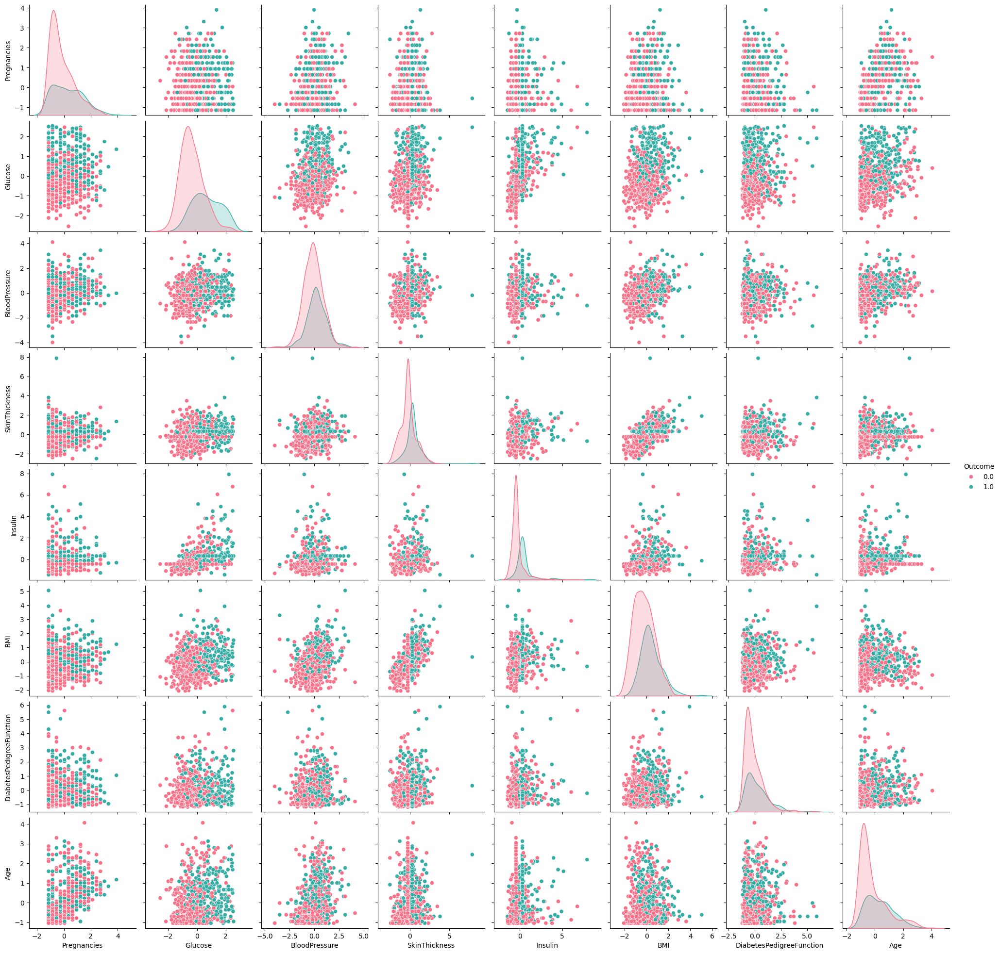

In [30]:
# Estandarización
pp = sns.pairplot(dataset2, hue="Outcome", palette="husl")

Logramos apreciar que los descriptores de Glucosa, Grosor de la Piel e Insulina permiten una ligera sepación entre clases.

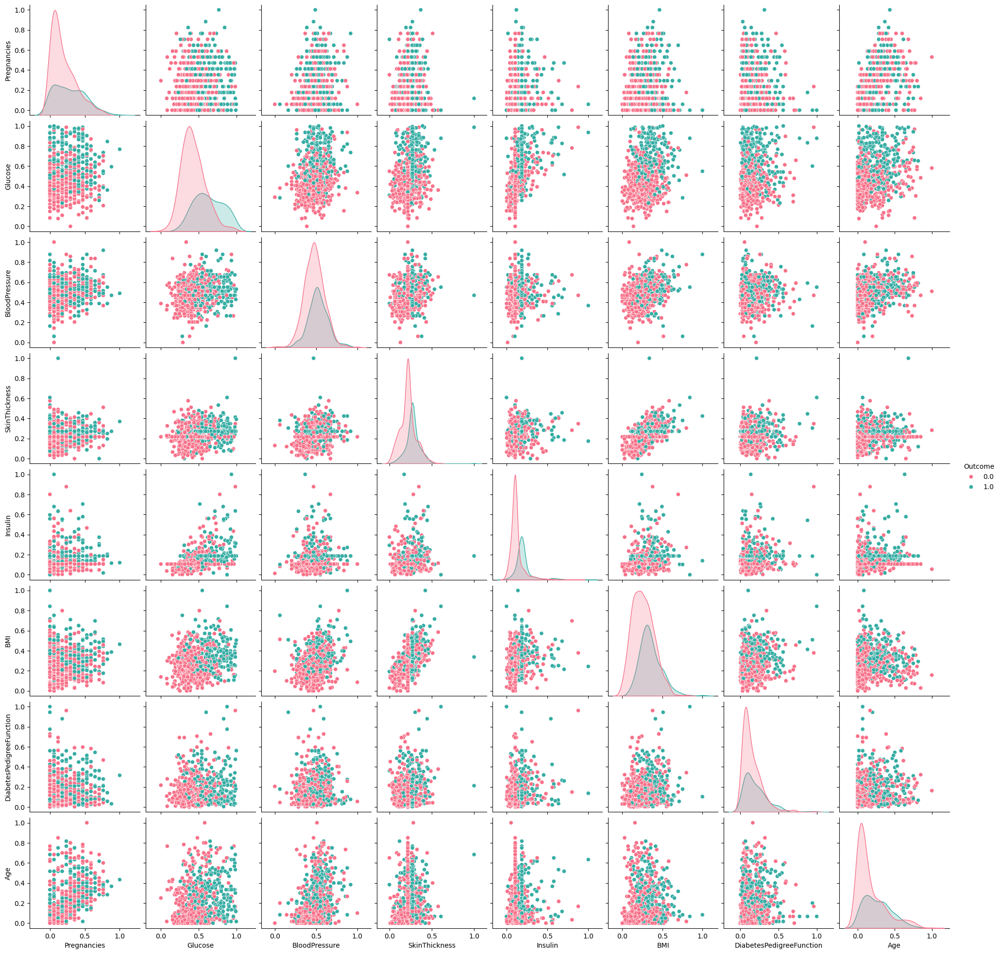

In [31]:
# Normalización
pp = sns.pairplot(dataset3, hue="Outcome", palette="husl")

### Manipulación de outliers

Actualizamos los valores del primer y del tercer cuartil para todos los descriptores del **set de datos estandarizados sin valores faltantes**.

In [32]:
dataset2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    float64
 1   Glucose                   768 non-null    float64
 2   BloodPressure             768 non-null    float64
 3   SkinThickness             768 non-null    float64
 4   Insulin                   768 non-null    float64
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    float64
 8   Outcome                   768 non-null    float64
dtypes: float64(9)
memory usage: 54.1 KB


Obtenemos la distancia inter-quartil estandarizada para los diversos atributos del set de datos.

In [33]:
Q1 = dataset2.iloc[:,:-1].quantile(0.25)
Q3 = dataset2.iloc[:,:-1].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

Pregnancies                 1.484832
Glucose                     1.330297
BloodPressure               1.322516
SkinThickness               0.787842
Insulin                     0.752447
BMI                         1.323441
DiabetesPedigreeFunction    1.155195
Age                         1.446492
dtype: float64


Actualizamos los outliers de esta nueva distribución de datos.

In [34]:
minimum = Q1 - 1.5 * IQR # limite inferior
maximum = Q3 + 1.5 * IQR # limiter superior
outliers = (dataset2.iloc[:,:-1] < minimum) | (dataset2.iloc[:,:-1] > maximum) # condicion de valores atipicos
print(outliers.sum()) # inspección de outliers por descriptor, sin variable de respuesta
print('Cantidad de outliers: {}'.format(outliers.values.sum())) # inspección total de outliers

Pregnancies                  4
Glucose                      0
BloodPressure               14
SkinThickness               87
Insulin                     51
BMI                          8
DiabetesPedigreeFunction    29
Age                          9
dtype: int64
Cantidad de outliers: 202


Removemos los outliers encontrados en el set de datos.

In [35]:
#Remover outliers usando percentiles
valid = ~outliers.any(axis=1)
dataset4 = dataset2[valid]
dataset4.info()

<class 'pandas.core.frame.DataFrame'>
Index: 590 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               590 non-null    float64
 1   Glucose                   590 non-null    float64
 2   BloodPressure             590 non-null    float64
 3   SkinThickness             590 non-null    float64
 4   Insulin                   590 non-null    float64
 5   BMI                       590 non-null    float64
 6   DiabetesPedigreeFunction  590 non-null    float64
 7   Age                       590 non-null    float64
 8   Outcome                   590 non-null    float64
dtypes: float64(9)
memory usage: 46.1 KB


Revisemos el tamaño del nuevo set de datos.

In [36]:
dataset4.shape

(590, 9)

Exploremos el balanceo de clases en este nuevo conjunto de datos.

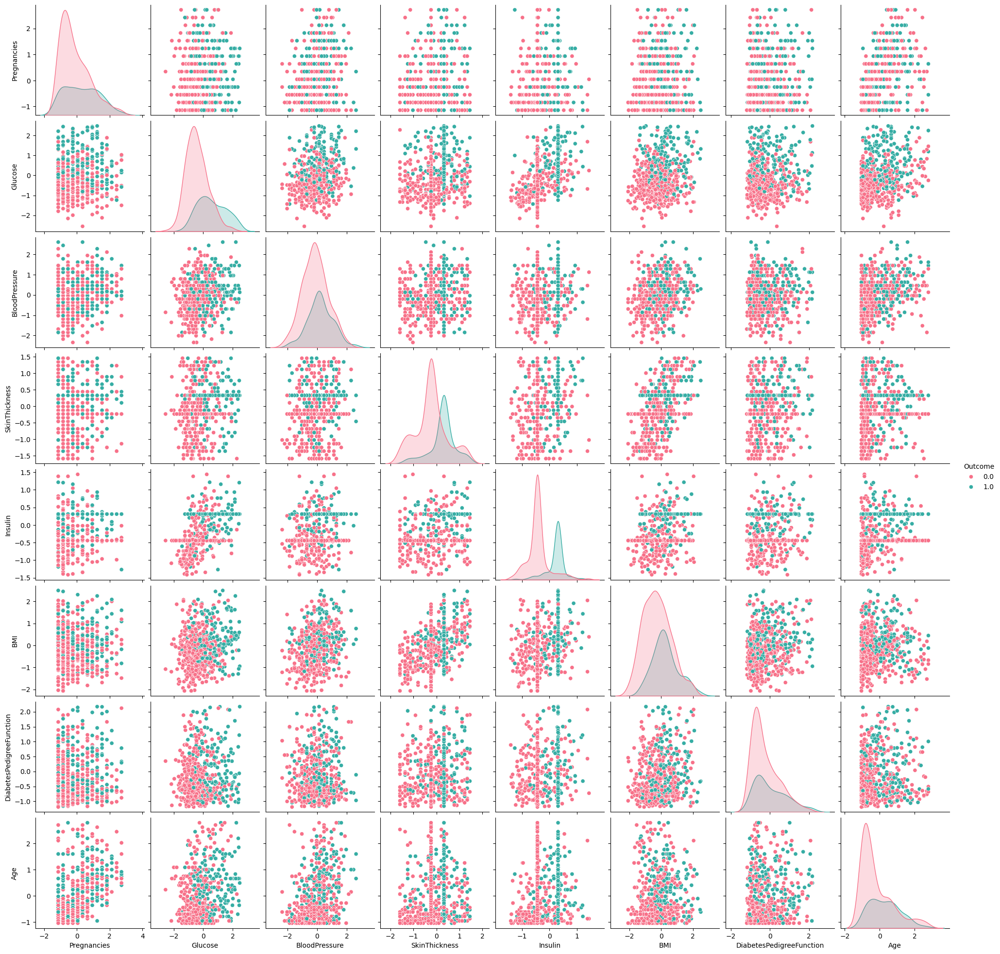

Outcome
0.0    398
1.0    192
Name: count, dtype: int64

In [37]:
#Observar si las clases están o no desbalanceadas
sns.pairplot(dataset4, hue="Outcome", palette="husl")
plt.show()
dataset4['Outcome'].value_counts()

Nótese la reducción en la cantidad de muestras tanto para la clase negativa (398, no diabéticos), como para la positiva (192, diabéticos), donde igual persiste el desbalanceo de clases de un 50% entre las clases.

Otras técnicas comunes de tratamiento de outliers:
- Eliminarlos usando desviación estándar.
- **Regla en distribución normal**: intervalo entre $media - 2\sigma$ y $media + 2\sigma$
- **Regla $3\sigma$**: mayor a 3 desviaciones estándar de la media.

## Selección de características

Existe una gran cantidad de técnicas de selección de características principalmente enfocadas en determinar cuáles características o combinaciones de las mismas son las más relevantes para la tarea de predicción.

En particular, es deseable eliminar las variables **irrelevantes** y **redundantes**, con el fin de reducir la complejidad del modelo, su tiempo de entrenamiento y en ocasiones inclusive aumentar su desempeño. Para nuestro ejemplo actual, veremos una técnica para eliminar variables redundantes y otra para eliminar las irrelevantes.

### Redundancia de características

La **matriz de correlación de Pearson** nos muestra el grado de relación lineal (dependencia) entre cada par de predictores.

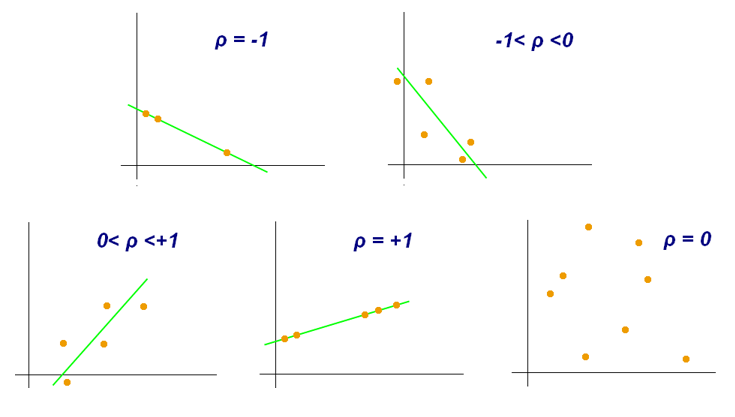

La idea es determinar aquellos descriptores que tenga una relación lineal *estadísticamente significativa* dentro de la distribución de datos. Para ello, se establece un umbral del 5% para la magnitud del coeficiente de Person.

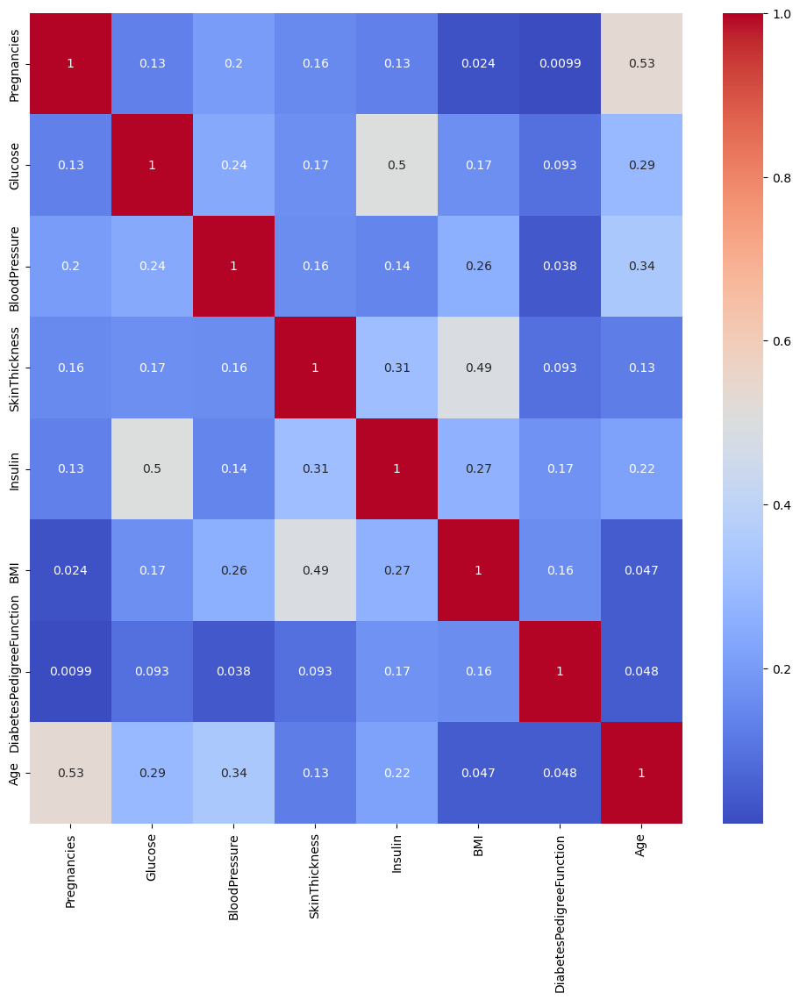

In [38]:
#Impresión de una matriz de correlación
#para cuantificar la dependencia entre las variables
cor = dataset4.iloc[:,:-1].corr()
plt.figure(figsize=(12,12))
sns.heatmap(cor, annot=True, cmap='coolwarm')
plt.show()

Una vez que determinamos que un coeficiente de correlación es estadísticamente significativo, como los valores mínimo y máximo son 0 y ±1 podemos valorar su magnitud de la siguiente manera: 0.20 será intuitivamente una relación baja y 0.85 indicará una relación que ya podemos considerar grande.

Los puntajes de correlación positiva presentan valores relativamente bajos para todos los pares descriptores, por lo que existe una baja redundancia, así que no resulta prudente omitir características para este conjunto de datos.

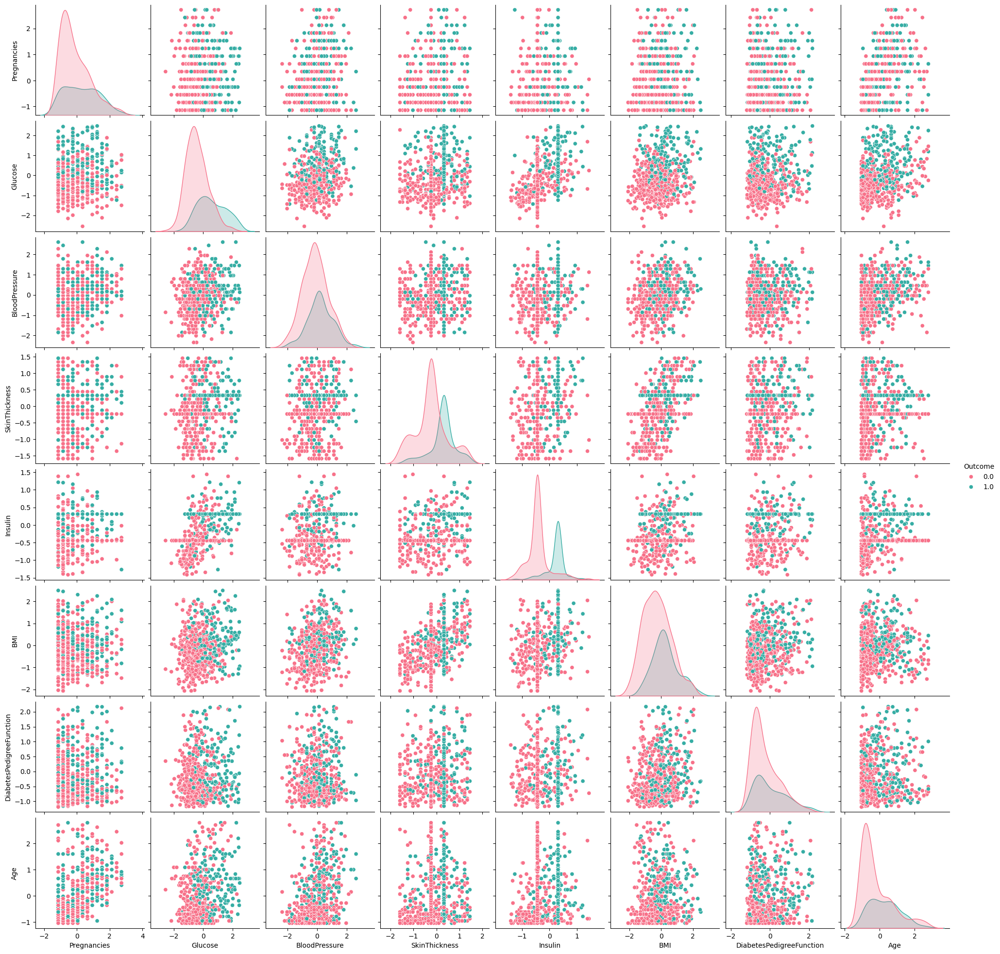

In [39]:
# Estandarización
pp = sns.pairplot(dataset4, hue="Outcome", palette="husl")

Observe ahora cómo el descriptor de Insulina se vuelve un descriptor relevante para la clasificación binaria en cuestión, según la distribución de clases.

### Relevancia de caracterísiticas

Más allá de un análisis de histogramas, con el fin de determinar cuáles **predictores son los más importantes** para la estimación de diabetes podemos usar un clasificador de bosque aleatorio (**Random Forest**).

In [40]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=100,random_state=0)
X = dataset4.iloc[:,:-1]
Y = dataset4['Outcome']
model.fit(X, Y)
featRanking = pd.Series(model.feature_importances_,index=X.columns).sort_values(ascending=False)
featRanking

Insulin                     0.413447
SkinThickness               0.157570
Glucose                     0.134710
Age                         0.078083
BMI                         0.070563
DiabetesPedigreeFunction    0.062097
BloodPressure               0.045711
Pregnancies                 0.037820
dtype: float64

Podemos selecionar los primeros tres predictores como los más importantes y descartar el resto.

In [41]:
dataset5 = dataset4[featRanking.index[:3]]
dataset5 = pd.concat([dataset5, dataset4[['Outcome']]], axis=1)
dataset5.head(n=5)

,Insulin,SkinThickness,Glucose,Outcome
0,0.311604,0.665181,0.864625,1.0
1,-0.440843,-0.010112,-1.204727,0.0
2,0.311604,0.327535,2.014265,1.0
3,-0.536303,-0.685405,-1.073339,0.0
5,-0.440843,-0.235210,-0.186474,0.0


Verifiquemos las últimas observaciones de la nueva versión del marco de datos.

In [42]:
dataset5.tail(n=5)

,Insulin,SkinThickness,Glucose,Outcome
762,-0.440843,-0.235210,-1.073339,0.0
764,-0.440843,-0.235210,0.010607,0.0
765,-0.334153,-0.685405,-0.022240,0.0
766,0.311604,0.327535,0.141994,1.0
767,-0.440843,0.214986,-0.941952,0.0


Verifiquemos el efecto en la matriz de correlación al seleccionar las características más relevantes del set de datos.

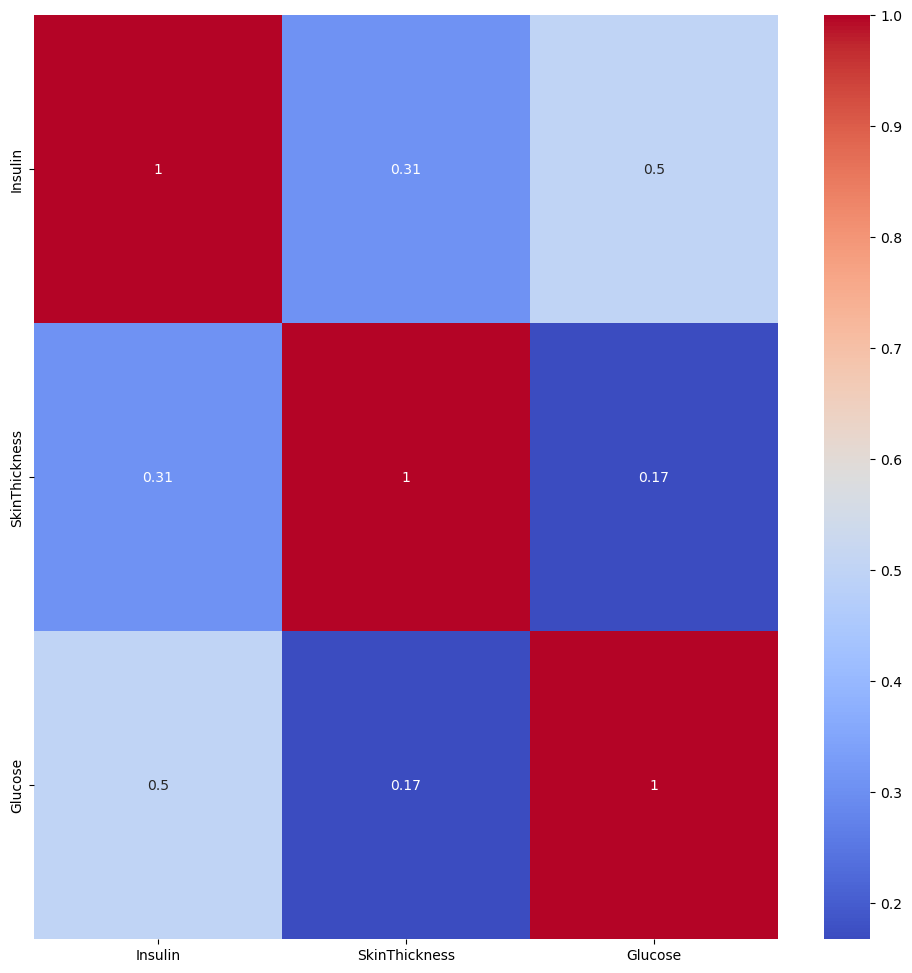

In [43]:
#Impresión de una matriz de correlación
#para cuantificar la dependencia entre las variables
cor = dataset5.iloc[:,:-1].corr()
plt.figure(figsize=(12,12))
sns.heatmap(cor, annot=True, cmap='coolwarm')
plt.show()

Finalmente, revisamos la distribución del nuevo set de datos.

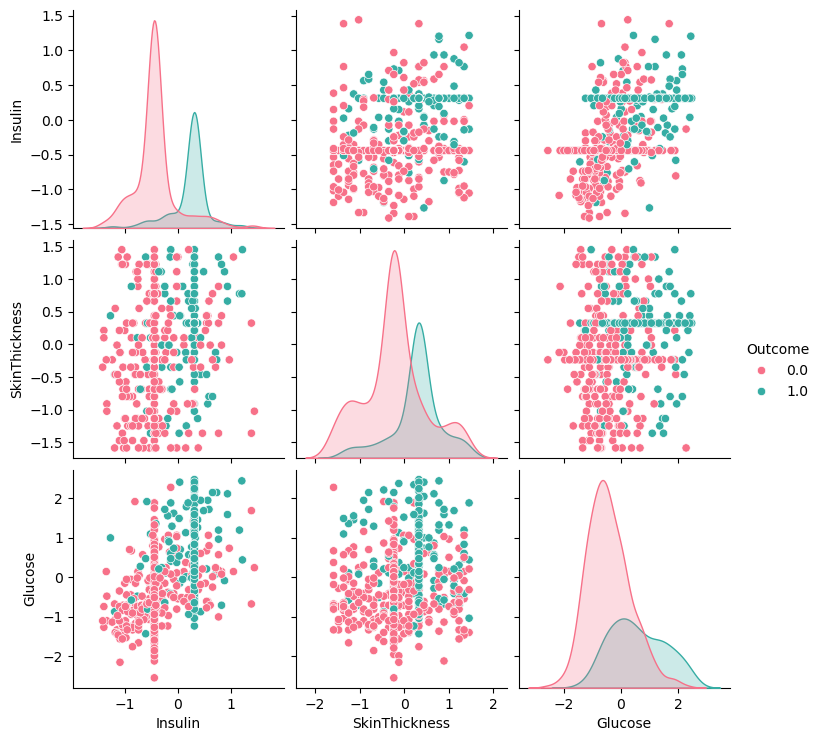

In [44]:
# Estandarización
pp = sns.pairplot(dataset5, hue="Outcome", palette="husl")

## Modelado de aprendizaje automático

Tal y como se ha visto, el problema a resolver en este ejemplo es una **clasificación** de personas diabéticas y no diabéticas, basado en ciertas medidas de diagnóstico, donde se considera un enfoque **supervisado**, puesto que se tiene conocimiento previo de las clases o etiquetas a predicir.

Para este caso, el **modelo** a tomar en cuenta es el de **regresión logística**, donde para ilustrar el proceso de entrenamiento, validación y pruebas de este modelo de aprendizaje automático.

### Codificación de categorías

Una estrategia opcional que suele proveer mejoras en el rendimientos de los modelos de aprendizaje automático corrresponde a codificación de arreglos de datos categóricos a numéricos. En este ejemplo, el set de datos empleados tiene la facilidad que la salida ya viene codificada; sin embargo, vamos a generar una codificación binaria de las etiquetas numéricas.

In [45]:
# extraemos el arreglo de salidas categorías
labels = dataset5.Outcome.values
print(labels.shape)

(590,)


La siguiente celda permite un vector fila en un vector columna, requerido para la codificación binaria.

In [46]:
target = labels.reshape(-1, 1)

Ahora, aplicamos codificación para transformar las etiquetas discretas a valores en formato *one-hot*.

In [47]:
from sklearn.preprocessing import OneHotEncoder
# one-hot encoding: 0 maps to the first encoded column and 1 to the second
encoder = OneHotEncoder(sparse_output=False, categories=[[0, 1]])
encoder.fit(target)
bin_labels = encoder.transform(target)
bin_labels

array([[0., 1.],
       [1., 0.],
       [0., 1.],
       ...,
       [1., 0.],
       [0., 1.],
       [1., 0.]])

Podemos revisar la codificación asignada o el mapeo para la variable objetivo

In [48]:
categories = encoder.categories_
encoder_mapping = {value: index for index, value in enumerate(categories[0])}
encoder_mapping

{0.0: 0, 1.0: 1}

Creamos una copia primero del dataset que hemos construido para actualizarlo con las categorias de salida transformadas.

In [49]:
dataset6 = dataset5.copy()
dataset6['Outcome'] = bin_labels
pd.DataFrame(dataset5['Outcome'].value_counts())

,count
Outcome,
0.0,398
1.0,192


### Sets de entrenamiento, validación y prueba

Con el fin de evitar el sobre-ajuste cuando estemos modelando nuestro algoritmo de aprendizaje automático, podemos realizar la partición del conjunto de datos en un par de particiones de entrenamiento-validación del modelo y otra para evaluación o experimentación del modelo entrenado.

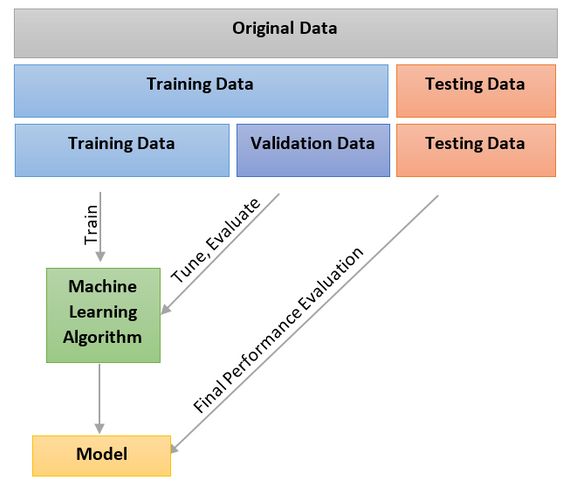

En nuestro caso, es importante recordar que existe un importante desbalance de clases, por lo que es recomendable hacer una **estratificación de los datos**, con el fin de mantener las mismas proporciones de las clases tanto en el set de prueba como el de entrenamiento.

In [50]:
#Division en set de prueba y entrenamiento con estratificación (shuffle deshabilitado)
from sklearn.model_selection import train_test_split
# Set de datos de entrada: 'dataset6'
train_data, test_data = train_test_split(dataset6, test_size=0.20, random_state=0, stratify=dataset6['Outcome'])
train_data, val_data = train_test_split(train_data, test_size=0.20, random_state=0, stratify=train_data['Outcome'])

Para ilustrar el proceso de entrenamiento, validación y pruebas del modelo dividiremos primero el set de datos en dos splits: entrenamiento y pruebas.

In [51]:
#Dividimos set de entrenamiento en predictores y variable de respuesta
train_X = train_data[train_data.columns[:3]]
train_Y = train_data['Outcome']
print(train_X.shape, train_Y.shape)
print(train_Y.value_counts())

(377, 3) (377,)
Outcome
1.0    254
0.0    123
Name: count, dtype: int64


Luego, el de entrenamiento es dividido en otros dos splits, uno nuevo para el entrenamiento y el otro para la validación del mismo.

In [52]:
#Dividimos set de pruebas en predictores y variable de respuesta
test_X = test_data[test_data.columns[:3]]
test_Y = test_data['Outcome']
print(test_X.shape, test_Y.shape)
print(test_Y.value_counts())

(118, 3) (118,)
Outcome
1.0    80
0.0    38
Name: count, dtype: int64


Generamos los arreglos de datos y etiquetas para la validación del entrenamiento; además, desplegamos las dimensiones y la distribución.

In [53]:
#Dividimos set de validación en predictores y variable de respuesta
val_X = val_data[val_data.columns[:3]]
val_Y = val_data['Outcome']
print(val_X.shape, val_Y.shape)
print(val_Y.value_counts())

(95, 3) (95,)
Outcome
1.0    64
0.0    31
Name: count, dtype: int64


Procedermos con el entrenamiento del modelo de regresión logística como clasificador binario.

In [54]:
#Entrenamiento del modelo
from sklearn.linear_model import LogisticRegression
logReg = LogisticRegression()
logReg = logReg.fit(train_X, train_Y)

#Exactitud en el set de entrenamiento
print('Exactitud del modelo de clasificación con el dataset6 en el set de entrenamiento: ', logReg.score(train_X, train_Y))

#Exactitud en el set de validación
print('Exactitud del modelo de clasificación con el dataset6 en el set de validación: ', logReg.score(val_X, val_Y))

#Exactitud en el set de pruebas
print('Exactitud del modelo de clasificación con el dataset6 en el set de pruebas: ', logReg.score(test_X, test_Y))

Exactitud del modelo de clasificación con el dataset6 en el set de entrenamiento:  0.8806366047745358
Exactitud del modelo de clasificación con el dataset6 en el set de validación:  0.8842105263157894
Exactitud del modelo de clasificación con el dataset6 en el set de pruebas:  0.8220338983050848


### Métricas de evaluación

En algunas ocasiones la exactitud no es la métrica más apropiada o no resulta suficiente para medir el desempeño de un modelo de clasificación. Por ejemplo, en aplicaciones como la detección de transacciones bancarias fraudulentas,  donde se tiene un alto desbalance de clases (digamos 99% de transacciones normales y 1% de transacciones fraudulentas), el modelo al entrenarse puede llegar a predecir todas las observaciones como pertenecientes a la clase dominante y aún así obtener un altísimo valor de exactitud (99%).

Para detectar este tipo de falencias del modelo podemos calcular la **presición**, la **exhaustividad** o el **puntaje $F_1$**:

- Si el interés está enfocado en reducir los FP, la presición:

  $\mathit{pre}=\frac{\mathit{VP}}{\mathit{VP} + \mathit{FP}}$

  nos dice el porcentaje de predicciones positivas que fueron correctas.

- Si por el contrario el interés está enfocado en reducir los FN, la exhaustividad:

  $\mathit{exha}=\frac{\mathit{VP}}{\mathit{VP} + \mathit{FN}}$
  
  que significa del total de observaciones pertenecientes a la clase positiva cuantas fueron correctamente detectadas.

- Por último, si en nuestro problema los FP y FN tienen la misma importancia y se desea reducir ambos equitativamente, el puntaje $F_1$ resulta sumamente útil:

  $F_1=2 \frac{\mathit{pre} \cdot \mathit{exha}}{\mathit{pre} + \mathit{exha}}$

In [55]:
from sklearn.metrics import f1_score, recall_score, precision_score
#Predicciones en el set de entrenamiento
predict_train = logReg.predict(train_X)
print('Resultados para el set de entrenamiento:')
print('Precisión:', precision_score(train_Y, predict_train),'Exhaustividad:', recall_score(train_Y, predict_train))
print('F1_score:', f1_score(train_Y, predict_train), 'Exactitud:', logReg.score(train_X, train_Y))

Resultados para el set de entrenamiento:
Precisión: 0.9066147859922179 Exhaustividad: 0.9173228346456693
F1_score: 0.9119373776908023 Exactitud: 0.8806366047745358


In [56]:
#Predicciones en el set de validación
predict_val = logReg.predict(val_X)
print('Resultados para el set de validación:')
print('Precisión:',precision_score(val_Y, predict_val),'Exhaustividad:',recall_score(val_Y, predict_val))
print('F1_score:',f1_score(val_Y, predict_val), 'Exactitud:',logReg.score(val_X, val_Y))

Resultados para el set de validación:
Precisión: 0.8840579710144928 Exhaustividad: 0.953125
F1_score: 0.9172932330827067 Exactitud: 0.8842105263157894


In [57]:
#Predicciones en el set de pruebas
predict_test = logReg.predict(test_X)
print('Resultados para el set de pruebas:')
print('Precisión:',precision_score(test_Y, predict_test),'Exhaustividad:',recall_score(test_Y, predict_test))
print('F1_score:',f1_score(test_Y, predict_test), 'Exactitud:',logReg.score(test_X, test_Y))

Resultados para el set de pruebas:
Precisión: 0.8831168831168831 Exhaustividad: 0.85
F1_score: 0.8662420382165605 Exactitud: 0.8220338983050848


Para nuestro problema, vamos a suponer que tanto los falsos negativos (personas diabéticas clasificadas como no diabéticas) como los falsos positivos (personas no diabéticas clasificadas como diabéticas) son igual de importantes y por lo tanto usaremos el puntaje $F_1$ como la métrica oficial.

### Crosvalidación

Como pudimos observar anteriormente, al particionar los datos hemos alterado y reducido drásticamente la distribución de los datos por clase, donde los resultados podrían estar sujetos a una selección aleatoria de los pares de datos tanto para entrenamiento como para la validación y la evaluación, introduciendo posibles sesgos al modelo.

Para solventar esta situación y así favorecer a la mitigación del sobre-ajuste, aplicamos la técnica de **crosvalidación (CV)**, ampliente usada en soluciones basadas en aprendizaje automático. El acercamiento más básico denominado CV de *k-fold*, el set de entrenamiento es divido entro k-sets más pequeños. Para cada uno de los k-folds, se ejecuta el siguiente proceso:

*   El modelo es entrenado usando $k-1$ pliegues como conjunto de entrenamiento.
*   El modelo resultante es validado en el parte restante de los datos; por ejemplo, se utiliza como de set de pruebas para calcular alguna métrica de rendimiento para clasificación.

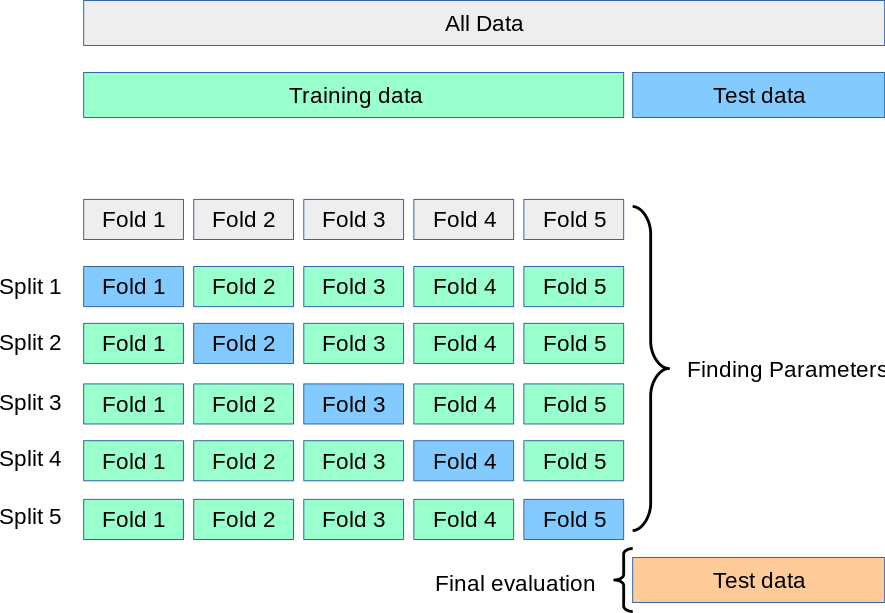

Ejecutamos la partición del conjunto de datos y calculamos el puntaje de crosvalidación para el modelo de regresión.

In [58]:
# importamos el objeto para el cálculo del puntaje de crosvalidación
from sklearn.model_selection import cross_val_score
# split ratio
split_ratio = 0.20
# cantidad de procesado de validación
k_folds = 5
# ejecutamos la partición sobre el marco de datos modificado
train_data, test_data = train_test_split(dataset6, test_size=split_ratio, random_state=0, stratify=dataset6['Outcome'])
# obtenemos los valores por índice para los valores de los descriptores la partición de entrenamiento
train_X = train_data[train_data.columns[:3]]
# obtenemos los valores por índice para las variables objetivo de la partición de entrenamiento
train_Y = train_data['Outcome']
# lista de valores de exactitud
scores = cross_val_score(logReg, train_X, train_Y, cv=k_folds)
scores

array([0.84210526, 0.91578947, 0.88297872, 0.84042553, 0.88297872])

La métrica de rendimiento reportada por la CV corresponde al promedio de los valores calculado en el proceso iterativo. Esta técnica puede ser computacionalmente demandante, pero no desperdicia muchos datos, lo que es una ventaja cuando el set de datos tiene una distribución de muestras reducida.

In [59]:
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

0.87 accuracy with a standard deviation of 0.03


Podemos calcular las otras métricas para evaluar la clasificación binario usando aprendizaje automático, mediante la operación de crosvalidación en `scikit-learn`. Definimos las metricas de interés.

In [60]:
# importamos el objeto para la función de crosvalidación
from sklearn.model_selection import cross_validate
# lista con las métricas de interés para clasificación binaria
scoring = ['precision_macro', 'recall_macro', 'f1_macro']
# calculamos los puntajes definidos con la función de convalidación
scores = cross_validate(logReg, train_X, train_Y, scoring=scoring,
                        cv=k_folds, return_train_score=True)
scores

{'fit_time': array([0.00708604, 0.00317359, 0.00322342, 0.00305676, 0.00318503]),
 'score_time': array([0.00934935, 0.00620198, 0.00618839, 0.00617027, 0.00616455]),
 'test_precision_macro': array([0.81944444, 0.91039707, 0.87554113, 0.83031674, 0.86029056]),
 'train_precision_macro': array([0.85103576, 0.83615274, 0.86717731, 0.86309524, 0.86157166]),
 'test_recall_macro': array([0.82459677, 0.89591734, 0.85535074, 0.79902714, 0.8875    ]),
 'train_recall_macro': array([0.84496831, 0.82883618, 0.8591583 , 0.86757532, 0.85382271]),
 'test_f1_macro': array([0.82189726, 0.9025641 , 0.864144  , 0.81116914, 0.87066917]),
 'train_f1_macro': array([0.84786609, 0.83228588, 0.86294968, 0.86525986, 0.85748321])}

Tomando en cuenta el interés por el puntaje $F1$ en el conjunto de pruebas, podemos analizar la crosvalidación resultante tomando en cuenta esta métrica.

In [61]:
# obtenemos de scores (dict) los valores de interés
test_f1_macro = scores.get('test_f1_macro')
print("%0.2f test f1-score with a standard deviation of %0.2f" % (test_f1_macro.mean(), test_f1_macro.std()))

0.85 test f1-score with a standard deviation of 0.03


### Refinamiento del modelo

El proceso de refinamiento de los parámetros de uno o varios modelos de aprendizaje automático suele ser iterativo y es importante un diseño apropiado de los experimentos. Por ejemplo, podemos ver cuanto aumentó o disminuyó el desempeño del modelo de regresión logística simple para cada transformación que le aplicamos al set de datos.

In [62]:
#Ver qué transformaciones de los datos permiten al modelo tener el mejor desempeño sobre el set de validación.
#dataset0: set de datos original
#dataset1: set de datos sin valores faltantes o inválidos
#dataset2: set estandarizado con valores rellenados
#dataset3: set normalizado con valores rellenados
#dataset4: set estandarizado con valores rellenados y sin outliers
#dataset5: set estandarizado con los 3 atributos más relevantes
#dataset6: set de datos con las categorias codificadas (one-hot)
list_of_datasets = [dataset, dataset1, dataset2, dataset3, dataset4, dataset5, dataset6]
models = []
results = pd.DataFrame(columns=['Datasets', 'F1_train', 'F1_val', 'F1_test'])

#Iteramos por los distintos set de datos
for i, d in enumerate(list_of_datasets):
  #Generamos 3 splits para entrenamiento, validación y pruebas
  train, test = train_test_split(d, test_size=0.20, random_state=0, stratify=d['Outcome'])
  train, val = train_test_split(train, test_size=0.20, random_state=0, stratify=train['Outcome'])

  #Dividimos set de entrenamiento en predictores y variable de respuesta
  train_X = train[train.columns[:-1]]
  train_Y = train['Outcome']

  #Dividimos set de validación en predictores y variable de respuesta
  val_X = val[val.columns[:-1]]
  val_Y = val['Outcome']

  #Dividimos set de validación en predictores y variable de respuesta
  test_X = test[test.columns[:-1]]
  test_Y = test['Outcome']

  #Entrenamiento del modelo de regresión lineal ordinaria
  m = LogisticRegression(max_iter=400)
  m = m.fit(train_X, train_Y)
  models.append(m)

  #Predicciones
  predict_train = m.predict(train_X)
  predict_val = m.predict(val_X)
  predict_test = m.predict(test_X)

  #Desempeño
  res_data = pd.DataFrame.from_dict({'Datasets':[str('dataset{}'.format(i))],
                                     'F1_train':[f1_score(train_Y, predict_train)],
                                     'F1_val':[f1_score(val_Y, predict_val)],
                                     'F1_test':[f1_score(test_Y, predict_test)]
                                     })
  results = pd.concat([results, res_data], ignore_index=True)
#Desplegamos el dataframe
results

/tmp/ipykernel_2976041/2507172898.py:47: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = pd.concat([results, res_data], ignore_index=True)


,Datasets,F1_train,F1_val,F1_test
0,dataset0,0.651466,0.602740,0.638298
1,dataset1,0.706250,0.555556,0.617021
2,dataset2,0.702194,0.555556,0.617021
3,dataset3,0.679487,0.529412,0.586957
4,dataset4,0.838174,0.700000,0.805195
5,dataset5,0.814815,0.677966,0.825000
6,dataset6,0.911937,0.917293,0.866242


## Conclusiones sobre el aprendizaje automático

- Existe una enorme variedad en cuanto a tipos de datos, problemas, técnicas de preprocesamiento, modelos de aprendizaje automático y formas de medir su desempeño. No existe un único camino "correcto" para aplicar el aprendizaje automático y puede variar significativamente entre cada caso.
- El proceso de entrenamiento y refinamiento de los parámetros de uno o varios modelos de aprendizaje automático suele ser iterativo y es importante un diseño apropiado de los experimentos.
- Es vital seleccionar las métricas adecuadas según el problema que se quiera resolver.
- Para combatir el problema del sobreajuste, existen diversas técnicas de **regularización** aplicables a muchos modelos de aprendizaje automático. También puede resultar útil aumentar el tamaño del set de entrenamiento o probar otros modelos.
- También existen muchos métodos para lidiar con el desbalance de clases basadas en la creación de datos artificiales, usar pesos predeterminados en el modelo para darle más importancia a las clases menos representadas, entre otros.

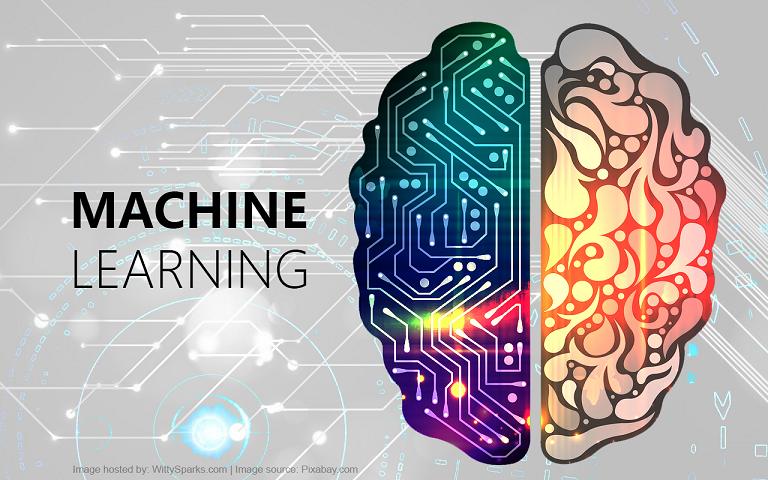

## Práctica 5

Aumentar la **complejidad del modelo** de clasificación binaria y cantidad de iteraciones para ver hasta que punto se puede mejorar el puntaje $F_1$, especialmente en el set de validación y pruebas. Reportar cuál de los set de datos es el que permite el mejor desempeño luego de utilizar un modelo más complejo. Seguidamente, responda:

1. De acuerdo con los resultados base obtenidos con la regresión logística original, el puntaje $F_1$ aumenta en el set de validación al rellenar valores inválidos y eliminar los outliers, ¿esto mismo se cumple al aumentar la complejidad del modelo?

2. Si quisiéramos optimizar el modelo para reducir al máximo la cantidad de falsos negativos (personas con diabetes clasificadas como no diabéticas), ¿cuál sería la métrica más conveniente? Realice las modificaciones a nivel de código para mostrar el resultado de esta métrica.

In [ ]:
# Puede hacer su práctica aquí